In [1]:
from keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, Dropout
from keras.models import Model
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras import regularizers 
from tensorflow.keras.layers import BatchNormalization as bn
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras.models import model_from_json
import tensorflow as tf 
import keras.backend as K
from patchify import patchify

In [2]:
cd C:/Users/ghrceaiml1/Desktop/3D liver tumour segmentation/dataset/LITS17/

C:\Users\ghrceaiml1\Desktop\3D liver tumour segmentation\dataset\LITS17


In [3]:
#!pip install nibabel

In [3]:
import nibabel as nib
from glob import glob
import matplotlib.pyplot as plt
import numpy as np
from random import shuffle

In [93]:
img_path = glob("volume-*.nii")
mask_path = glob("segmentation-*.nii")

print("Number of images :", len(img_path))

Number of images : 97


In [94]:
import re

def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    return [ atoi(c) for c in re.split(r'(\d+)', text) ]

In [95]:
img_path.sort(key=natural_keys)
mask_path.sort(key=natural_keys)

In [7]:
img_list=[]
for i in range(0,30):
    img=np.array(nib.load(img_path[i]).get_data())
    img.astype('float32')
    for slice in range(0,img.shape[2]):
        img_s=img[:,:,slice]
        img_s=np.expand_dims(img_s,axis=2)
        img_list.append(img_s)
img_arr=np.array(img_list)     

C:\Users\ghrceaiml1\AppData\Local\Temp\180\ipykernel_24380\1180498872.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img=np.array(nib.load(img_path[i]).get_data())


In [8]:
mask_list=[]
label=1
for i in range(0,30):
    img=np.array(nib.load(mask_path[i]).get_data())
    img.astype('float32')
    if label==1:
        img[img == 1] = 0
    if label==0:
        img[img == 2] = 1
    for slice in range(0,img.shape[2]):
        img_s=img[:,:,slice]
        img_s=np.expand_dims(img_s,axis=2)
        mask_list.append(img_s)
mask_arr=np.array(mask_list)

C:\Users\ghrceaiml1\AppData\Local\Temp\180\ipykernel_24380\606193184.py:4: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img=np.array(nib.load(mask_path[i]).get_data())


In [9]:
img_arr.shape, mask_arr.shape

((5127, 512, 512, 1), (5127, 512, 512, 1))

In [10]:
np.save('img_arr.npy',img_arr)
np.save('mask_arr.npy',mask_arr)

In [11]:
img_list_val=[]
for i in range(80,96):
    img=np.array(nib.load(img_path[i]).get_data())
    img.astype('float32')
    for slice in range(0,img.shape[2]):
        img_s=img[:,:,slice]
        img_s=np.expand_dims(img_s,axis=2)
        img_list_val.append(img_s)
img_arr_val=np.array(img_list_val) 

C:\Users\ghrceaiml1\AppData\Local\Temp\180\ipykernel_24380\3391373367.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img=np.array(nib.load(img_path[i]).get_data())


In [12]:
mask_list_val=[]
label=1
for i in range(80,96):
    img=np.array(nib.load(mask_path[i]).get_data())
    img.astype('float32')
    if label==1:
        img[img == 1] = 0
    if label==0:
        img[img == 2] = 1
    for slice in range(0,img.shape[2]):
        img_s=img[:,:,slice]
        img_s=np.expand_dims(img_s,axis=2)
        mask_list_val.append(img_s)
mask_arr_val=np.array(mask_list_val)

C:\Users\ghrceaiml1\AppData\Local\Temp\180\ipykernel_24380\2178232514.py:4: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img=np.array(nib.load(mask_path[i]).get_data())


In [13]:
img_arr_val.shape, mask_arr_val.shape

((9444, 512, 512, 1), (9444, 512, 512, 1))

In [14]:
np.save('img_arr_val.npy',img_arr_val)
np.save('mask_arr_val.npy',mask_arr_val)

In [12]:
!pip install patchify

You should consider upgrading via the 'C:\Users\ghrceaiml1\.conda\envs\Gputest\python.exe -m pip install --upgrade pip' command.


In [4]:
img_arr_val=np.load('img_arr_val.npy')
mask_arr_val=np.load('mask_arr_val.npy')
img_arr=np.load('img_arr.npy')
mask_arr=np.load('mask_arr.npy')

KeyboardInterrupt: 

In [16]:
total_patch=[]
total_mask=[]
for img in range(img_arr.shape[0]):

    large_image = img_arr[img]
    
    patches_img = patchify(large_image, (32, 32, 1), step=32)  #Step=32 for 32 patches means no overlap
    
    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            
            single_patch_img = patches_img[i,j,:,:]
            total_patch.append(single_patch_img)
total_patch=np.array(total_patch).reshape((len(total_patch), 32, 32, 1))            

for msk in range(mask_arr.shape[0]):
     
    large_mask = mask_arr[msk]
    
    patches_mask = patchify(large_mask, (32, 32, 1), step=32)  #Step=32 for 32 patches means no overlap
    

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            
            single_patch_mask = patches_mask[i,j,:,:]
            total_mask.append(single_patch_mask)
total_mask=np.array(total_mask).reshape((len(total_mask), 32, 32, 1))          

In [17]:
total_patch_val=[]
total_mask_val=[]
for img in range(img_arr_val.shape[0]):

    large_image = img_arr_val[img]
    
    patches_img = patchify(large_image, (32, 32, 1), step=32)  #Step=32 for 32 patches means no overlap
    
    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            
            single_patch_img = patches_img[i,j,:,:]
            total_patch_val.append(single_patch_img)
total_patch_val=np.array(total_patch_val).reshape((len(total_patch_val), 32, 32, 1))            

for msk in range(mask_arr_val.shape[0]):
     
    large_mask = mask_arr_val[msk]
    
    patches_mask = patchify(large_mask, (32, 32, 1), step=32)  #Step=32 for 32 patches means no overlap
    

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            
            single_patch_mask = patches_mask[i,j,:,:]
            total_mask_val.append(single_patch_mask)
total_mask_val=np.array(total_mask_val).reshape((len(total_mask_val), 32, 32, 1))  

In [5]:
np.save('total_patch.npy',total_patch)
np.save('total_mask.npy',total_mask)
np.save('total_patch_val.npy',total_patch_val)
np.save('total_mask_val.npy',total_mask_val)

NameError: name 'total_patch' is not defined

In [4]:
total_patch=np.load('total_patch.npy')
total_mask=np.load('total_mask.npy')
total_patch_val=np.load('total_patch_val.npy')
total_mask_val=np.load('total_mask_val.npy')

In [98]:
input_shape = [32, 32, 1]
dropout_rate = 0.3
l2_lambda = 0.0002

In [99]:
def weighted_binary_crossentropy(y_true, y_pred):
    
    y_true=tf.cast(y_true, tf.float32)
    
    y_pred = tf.clip_by_value(y_pred, 10e-8, 1.-10e-8)
    
    loss = - (y_true * K.log(y_pred) * 0.90 + (1 - y_true) * K.log(1 - y_pred) * 0.10)
    
    return K.mean(loss)

In [100]:
smooth = 1.
def dice_coef(y_true, y_pred):
    
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    #print(y_pred_f.shape)
    #print(y_true_f.shape)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [101]:
from keras import backend as K
from keras.layers import concatenate, Conv2DTranspose, Activation
from keras.layers import BatchNormalization


from keras.layers import Conv2D, Input, AvgPool2D
from keras.models import Model

dropout_rate = 0.5

def conv_batchnorm_relu_block(input_tensor, nb_filter, kernel_size=3):

    x = Conv2D(nb_filter, (kernel_size, kernel_size), padding='same')(input_tensor)
    x = BatchNormalization(axis=2)(x)
    x = Activation('relu')(x)

    return x


def model_build_func(input_shape, n_labels, using_deep_supervision=True):

    nb_filter = [32,64,128,256,512]

    # Set image data format to channels first
    global bn_axis

    K.set_image_data_format("channels_last")
    bn_axis = -1
    inputs = Input(shape=input_shape, name='input_image')

    conv1_1 = conv_batchnorm_relu_block(inputs, nb_filter=nb_filter[0])
    pool1 = AvgPool2D((2, 2), strides=(2, 2), name='pool1')(conv1_1)

    conv2_1 = conv_batchnorm_relu_block(pool1, nb_filter=nb_filter[1])
    pool2 = AvgPool2D((2, 2), strides=(2, 2), name='pool2')(conv2_1)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(conv2_1)
    conv1_2 = concatenate([up1_2, conv1_1], name='merge12', axis=bn_axis)
    conv1_2 = conv_batchnorm_relu_block(conv1_2,  nb_filter=nb_filter[0])

    conv3_1 = conv_batchnorm_relu_block(pool2, nb_filter=nb_filter[2])
    pool3 = AvgPool2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = concatenate([up2_2, conv2_1], name='merge22', axis=bn_axis)
    conv2_2 = conv_batchnorm_relu_block(conv2_2, nb_filter=nb_filter[1])

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = concatenate([up1_3, conv1_1, conv1_2], name='merge13', axis=bn_axis)
    conv1_3 = conv_batchnorm_relu_block(conv1_3, nb_filter=nb_filter[0])

    conv4_1 = conv_batchnorm_relu_block(pool3, nb_filter=nb_filter[3])
    pool4 = AvgPool2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=bn_axis)
    conv3_2 = conv_batchnorm_relu_block(conv3_2, nb_filter=nb_filter[2])

    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = concatenate([up2_3, conv2_1, conv2_2], name='merge23', axis=bn_axis)
    conv2_3 = conv_batchnorm_relu_block(conv2_3, nb_filter=nb_filter[1])

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = concatenate([up1_4, conv1_1, conv1_2, conv1_3], name='merge14', axis=bn_axis)
    conv1_4 = conv_batchnorm_relu_block(conv1_4, nb_filter=nb_filter[0])

    conv5_1 = conv_batchnorm_relu_block(pool4, nb_filter=nb_filter[4])

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=bn_axis)
    conv4_2 = conv_batchnorm_relu_block(conv4_2, nb_filter=nb_filter[3])

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=bn_axis)
    conv3_3 = conv_batchnorm_relu_block(conv3_3, nb_filter=nb_filter[2])

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, conv2_1, conv2_2, conv2_3], name='merge24', axis=bn_axis)
    conv2_4 = conv_batchnorm_relu_block(conv2_4, nb_filter=nb_filter[1])

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, conv1_1, conv1_2, conv1_3, conv1_4], name='merge15', axis=bn_axis)
    conv1_5 = conv_batchnorm_relu_block(conv1_5, nb_filter=nb_filter[0])

    nestnet_output_1 = Conv2D(n_labels, (1, 1), activation='sigmoid', name='output_1',padding='same')(conv1_2)
    nestnet_output_2 = Conv2D(n_labels, (1, 1), activation='sigmoid', name='output_2', padding='same' )(conv1_3)
    nestnet_output_3 = Conv2D(n_labels, (1, 1), activation='sigmoid', name='output_3', padding='same')(conv1_4)
    nestnet_output_4 = Conv2D(n_labels, (1, 1), activation='sigmoid', name='output_4', padding='same')(conv1_5)

    if using_deep_supervision:
        model = Model(inputs=inputs, outputs=[nestnet_output_1,
                                            nestnet_output_2,
                                            nestnet_output_3,
                                            nestnet_output_4])
    else:
        model = Model(inputs=inputs, outputs=nestnet_output_4)

    return model

In [20]:
def dense_unet(filters, output_channels, width=None, height=None, input_channels=1, conv_layers=2):
    def conv2d(layer_input, filters, conv_layers=2):
        concats = []

        d = Conv2D(filters, kernel_size=(3, 3), strides=(1, 1), padding='same')(layer_input)
        d = BatchNormalization()(d)
        d = Activation('relu')(d)

        concats.append(d)
        M = d

        for i in range(conv_layers - 1):
            d = Conv2D(filters, kernel_size=(3, 3), strides=(1, 1), padding='same')(M)
            d = BatchNormalization()(d)
            d = Activation('relu')(d)

            concats.append(d)
            M = concatenate(concats)

        return M

    def deconv2d(layer_input, filters):
        u = Conv2DTranspose(filters, 2, strides=(2, 2), padding='same')(layer_input)
        u = BatchNormalization()(u)
        u = Activation('relu')(u)
        return u

    inputs = Input(shape=(width, height, input_channels))

    conv1 = conv2d(inputs, filters, conv_layers=conv_layers)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv2d(pool1, filters * 2, conv_layers=conv_layers)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv2d(pool2, filters * 4, conv_layers=conv_layers)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = conv2d(pool3, filters * 8, conv_layers=conv_layers)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = conv2d(pool4, filters * 16, conv_layers=conv_layers)

    up6 = deconv2d(conv5, filters * 8)
    merge6 = concatenate([conv4, up6])
    conv6 = conv2d(merge6, filters * 8, conv_layers=conv_layers)

    up7 = deconv2d(conv6, filters * 4)
    merge7 = concatenate([conv3, up7])
    conv7 = conv2d(merge7, filters * 4, conv_layers=conv_layers)

    up8 = deconv2d(conv7, filters * 2)
    merge8 = concatenate([conv2, up8])
    conv8 = conv2d(merge8, filters * 2, conv_layers=conv_layers)

    up9 = deconv2d(conv8, filters)
    merge9 = concatenate([conv1, up9])
    conv9 = conv2d(merge9, filters, conv_layers=conv_layers)

    outputs = Conv2D(output_channels, kernel_size=(1, 1), strides=(1, 1), activation='softmax')(conv9)

    model = Model(inputs=inputs, outputs=outputs)

    return model

In [102]:
model=model_build_func(input_shape=input_shape,n_labels=1)

In [22]:
model=dense_unet(filters=32,output_channels=1,width=32, height=32, input_channels=1, conv_layers=2)

In [103]:
with tf.device('/GPU:0'):
  adam = Adam(lr = 0.001)
  model.compile(optimizer = adam, loss = weighted_binary_crossentropy, metrics = [dice_coef])
  history=model.fit(total_patch,total_mask,batch_size=512,epochs = 20)#validation_data=(total_patch_val,total_mask_val),)

Epoch 1/20


c:\Users\ghrceaiml1\.conda\envs\Gputest\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


61/62 [============================>.] - ETA: 0s - loss: 0.2484 - output_1_loss: 0.0667 - output_2_loss: 0.0618 - output_3_loss: 0.0605 - output_4_loss: 0.0593 - output_1_dice_coef: 0.2732 - output_2_dice_coef: 0.3161 - output_3_dice_coef: 0.3173 - output_4_dice_coef: 0.3356

KeyboardInterrupt: 

In [24]:
#model.summary()
#model = model.get_layer("model_7")
model_json = model.to_json()
with open("model_json_unet++.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("model_weights_unet++.h5")
print("Saved model to disk")

Saved model to disk


In [27]:
json_file = open('model_json_unet++.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("model_weights_unet++.h5")
print("Loaded model from disk")

Loaded model from disk


In [66]:
img_ex = nib.load(img_path[65]).get_data()
mask_ex = nib.load(mask_path[65]).get_data()

C:\Users\ghrceaiml1\AppData\Local\Temp\180\ipykernel_24380\339458463.py:1: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img_ex = nib.load(img_path[65]).get_data()
C:\Users\ghrceaiml1\AppData\Local\Temp\180\ipykernel_24380\339458463.py:2: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  mask_ex = nib.load(mask_path[65]).get_data()


In [30]:
from patchify import patchify, unpatchify

In [67]:
def slice_patch(img):
    img.astype('float32')
    patches_img = patchify(img, (32, 32), step=32)  #Step=32 for 32 patches means no overlap
    total_patch=[]
    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            
            single_patch_img = patches_img[i,j,:,:]
            total_patch.append(single_patch_img)
    total_patch=np.array(total_patch).reshape((len(total_patch), 32, 32, 1))
    print(total_patch.shape)
    return total_patch

In [68]:
patch_ratio = []

for i in range(32 + 1):
  patch_ratio.append(16 * i)

In [69]:
def patch_to_slice(patch, patch_ratio, input_shape, conf_threshold):
  
  slice = np.zeros((512, 512, 1))
  row_idx = 0
  col_idx = 0
  
  for i in range(len(patch)):
    
    slice[patch_ratio[row_idx]:patch_ratio[row_idx + 2], patch_ratio[col_idx]:patch_ratio[col_idx + 2]][patch[i] > conf_threshold] = 1
    
    col_idx += 1
    
    if i != 0 and (i+1) % 15 == 0:
      row_idx += 1
      col_idx = 0
  
  return slice

(256, 32, 32, 1)
8/8 [==============================] - 1s 10ms/step
(256, 32, 32, 1)


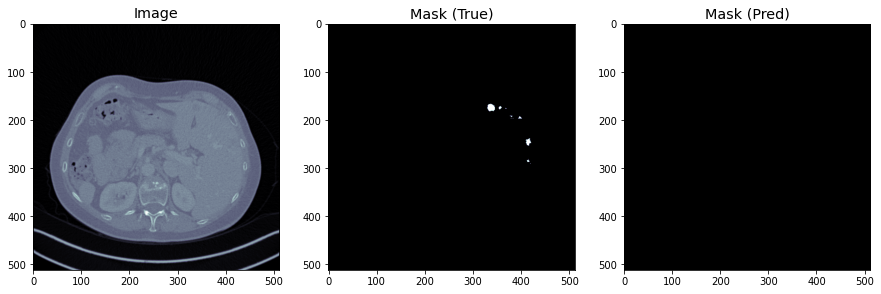

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


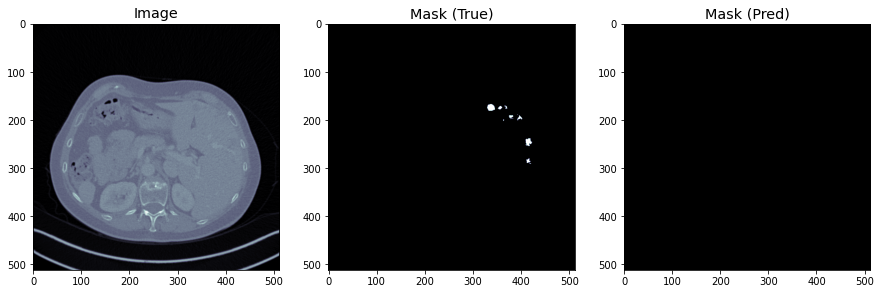

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


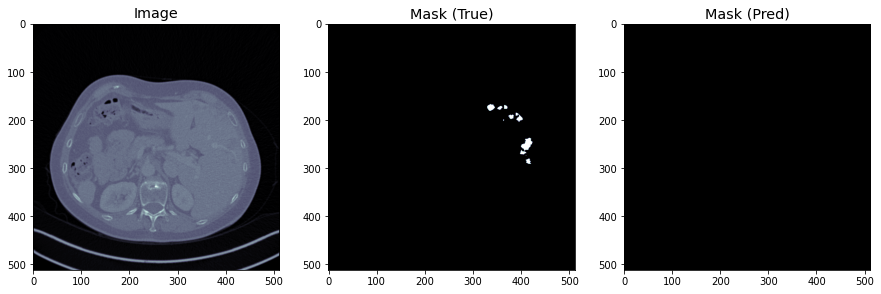

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


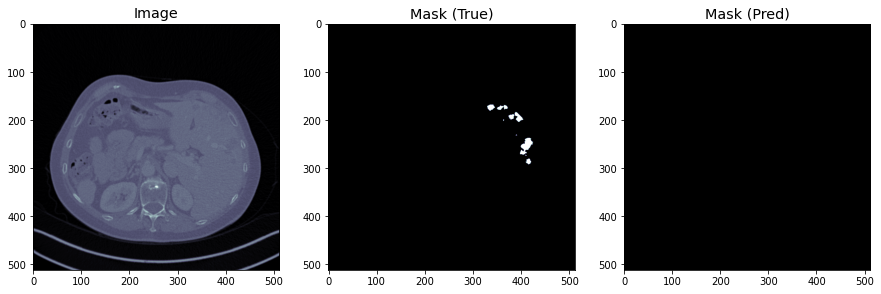

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


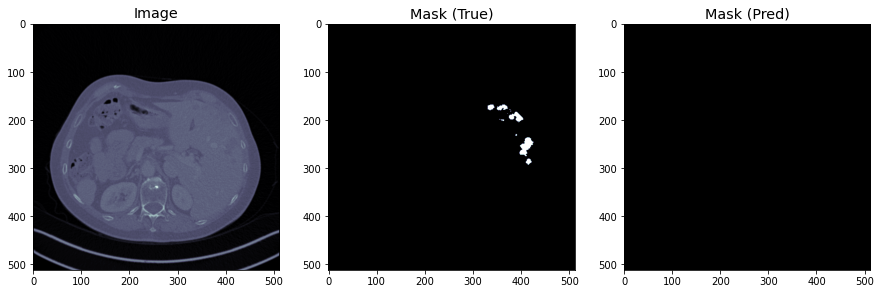

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


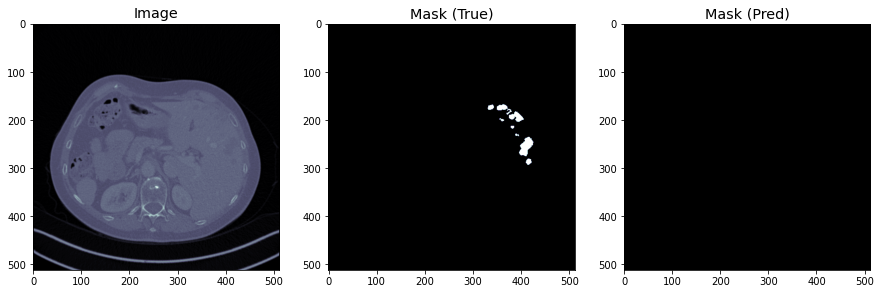

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


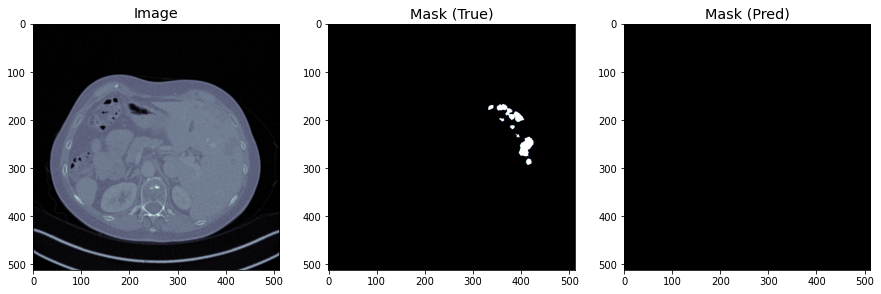

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


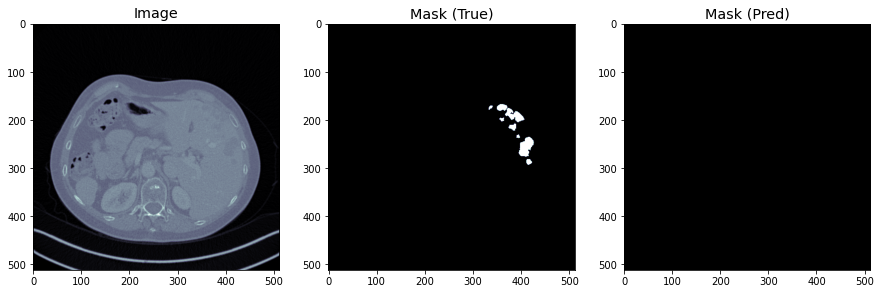

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


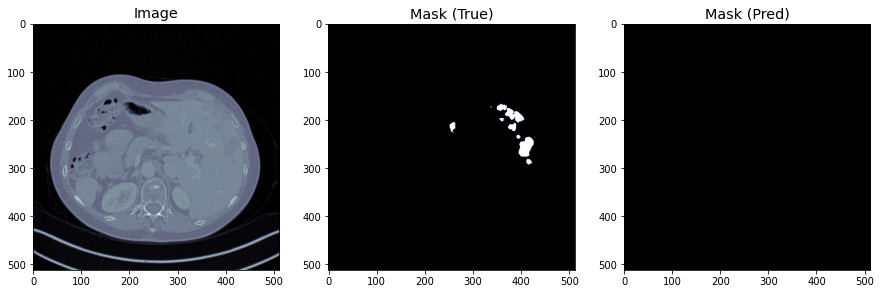

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


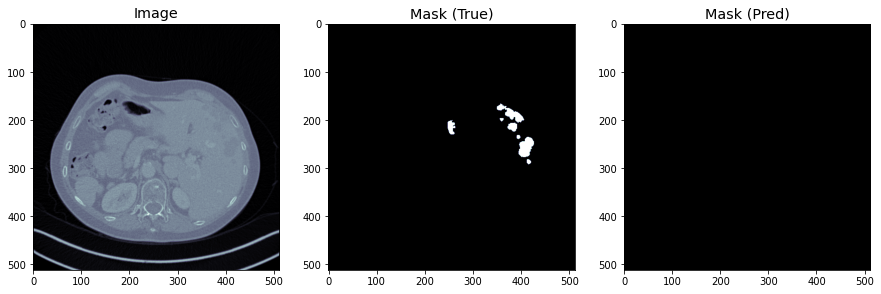

(256, 32, 32, 1)
8/8 [==============================] - 0s 12ms/step
(256, 32, 32, 1)


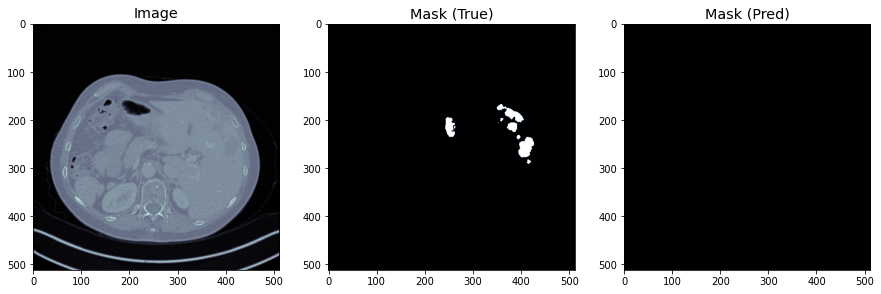

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


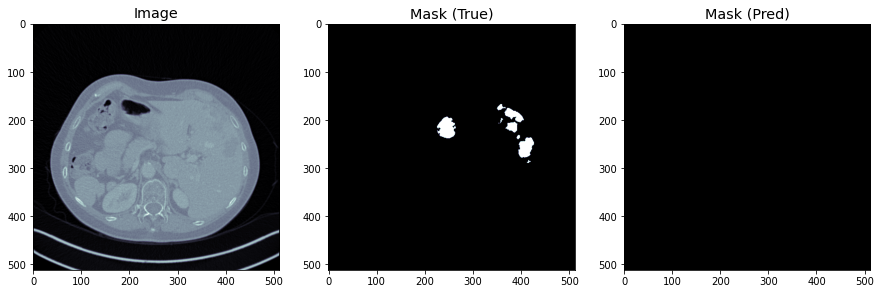

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


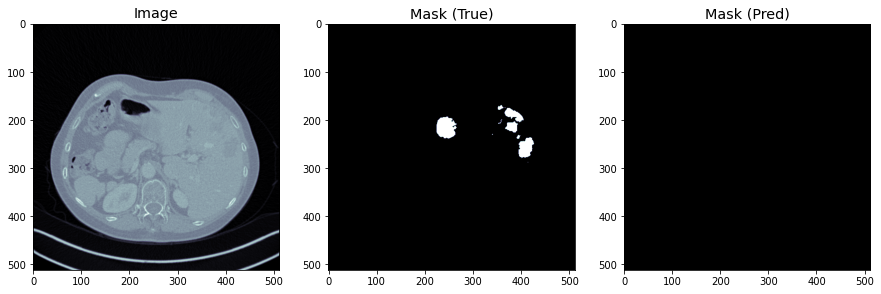

(256, 32, 32, 1)
8/8 [==============================] - 0s 12ms/step
(256, 32, 32, 1)


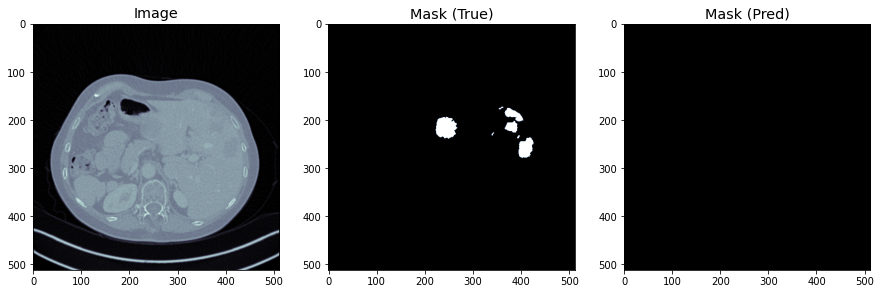

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


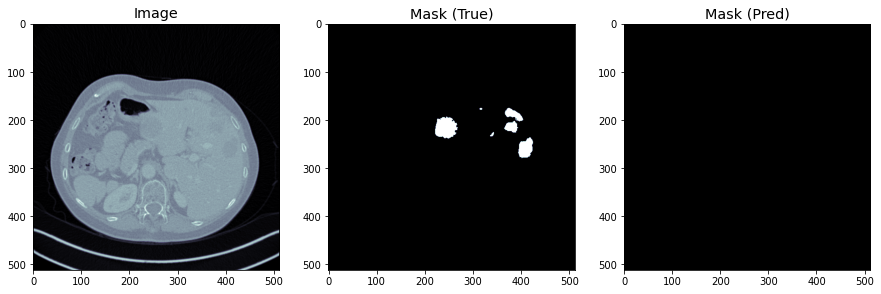

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


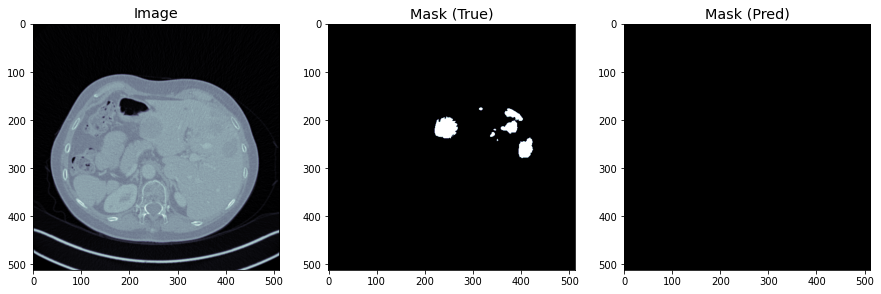

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


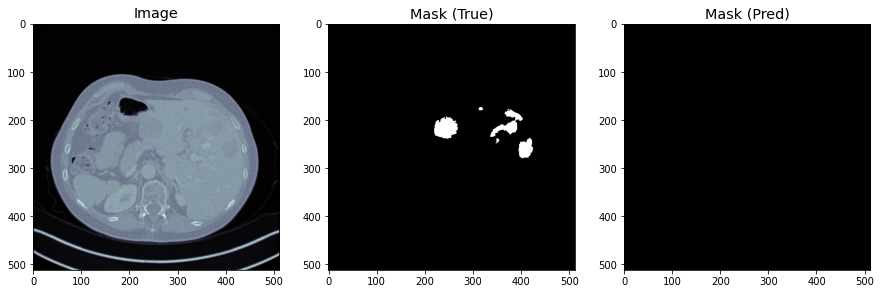

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


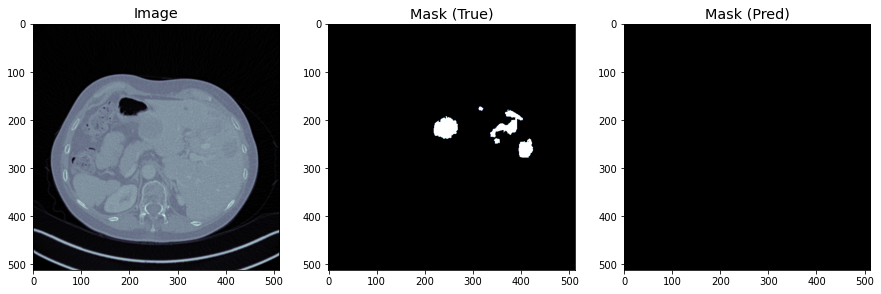

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


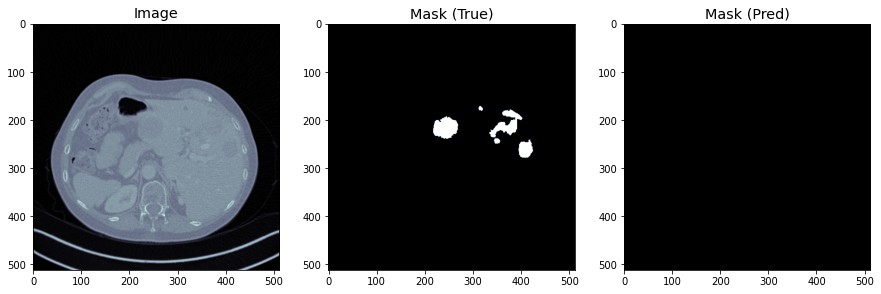

(256, 32, 32, 1)
8/8 [==============================] - 0s 17ms/step
(256, 32, 32, 1)


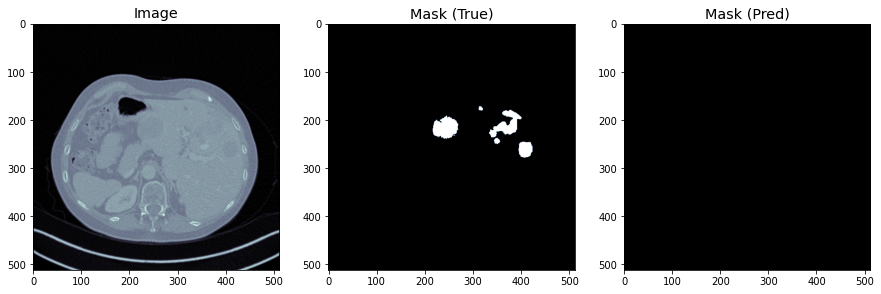

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


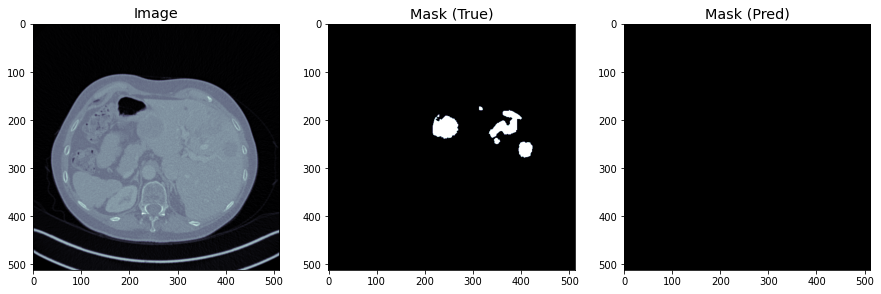

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


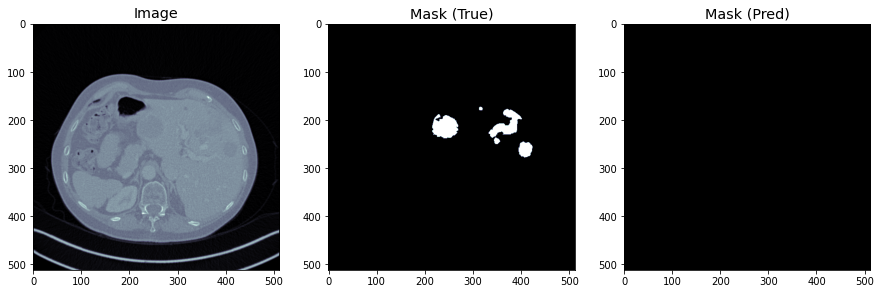

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


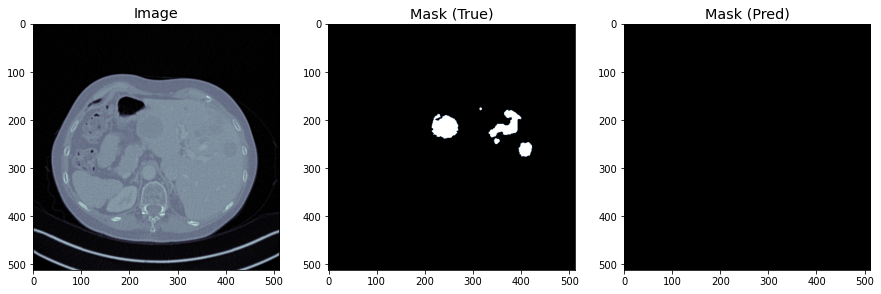

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


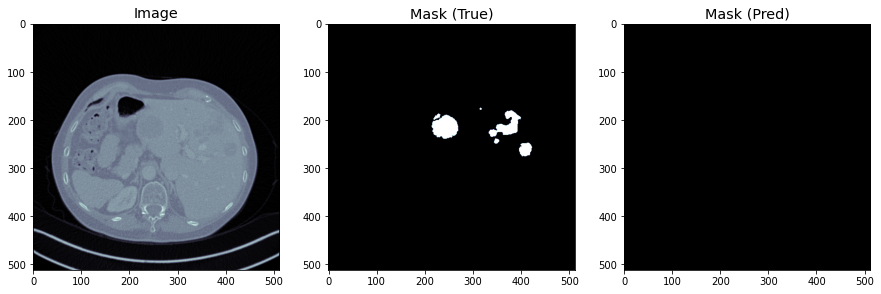

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


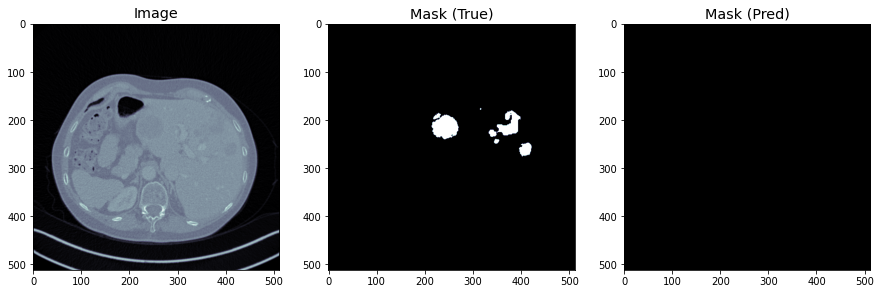

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


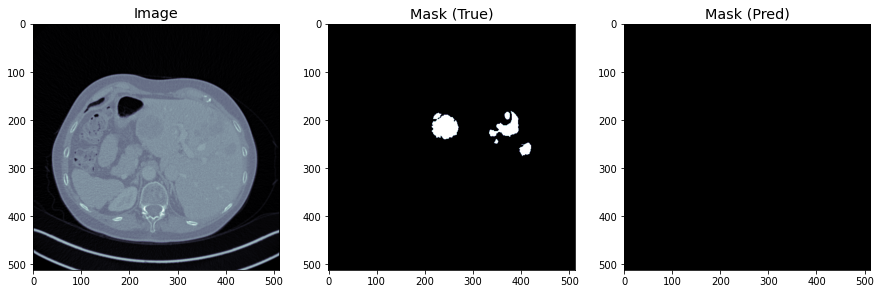

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


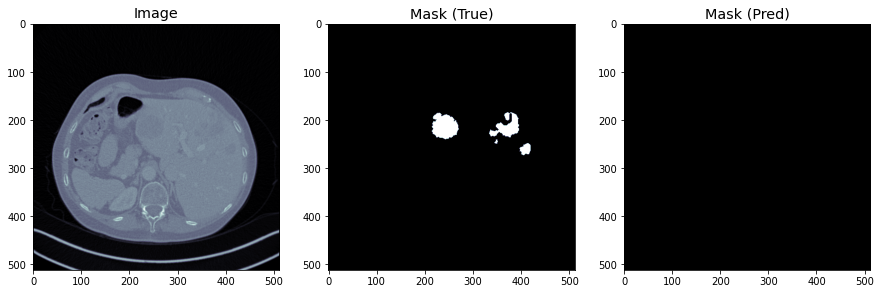

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


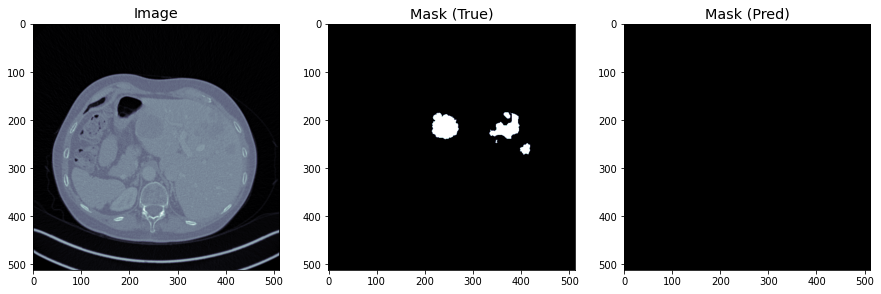

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


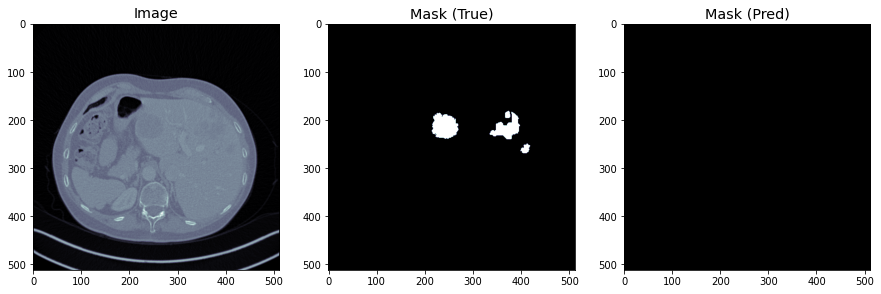

(256, 32, 32, 1)
8/8 [==============================] - 0s 16ms/step
(256, 32, 32, 1)


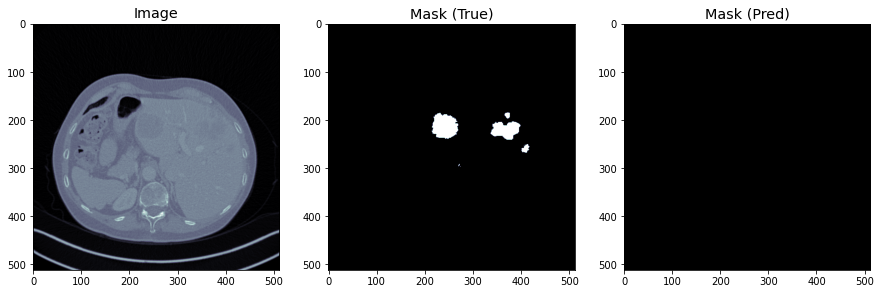

(256, 32, 32, 1)
8/8 [==============================] - 0s 13ms/step
(256, 32, 32, 1)


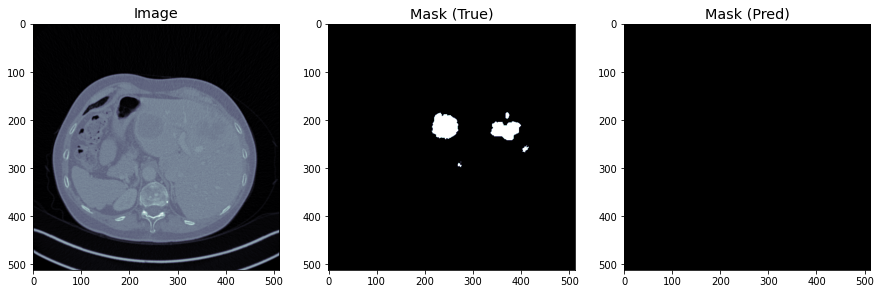

(256, 32, 32, 1)
8/8 [==============================] - 0s 15ms/step
(256, 32, 32, 1)


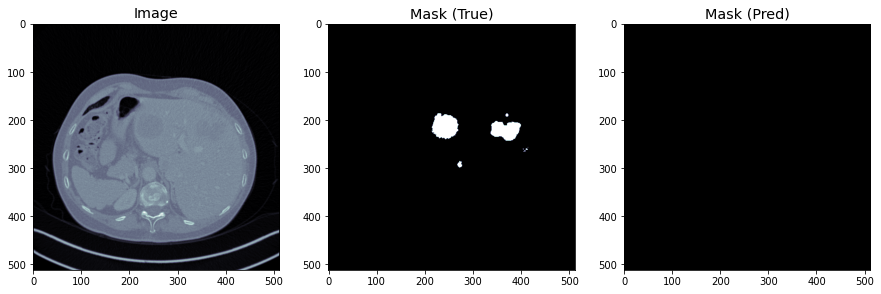

(256, 32, 32, 1)
8/8 [==============================] - 0s 18ms/step
(256, 32, 32, 1)


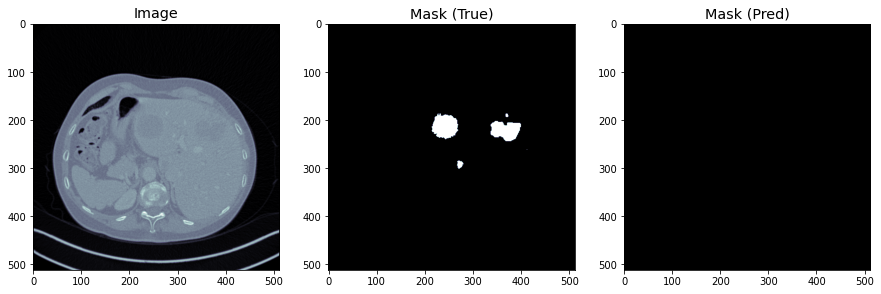

(256, 32, 32, 1)
8/8 [==============================] - 0s 18ms/step
(256, 32, 32, 1)


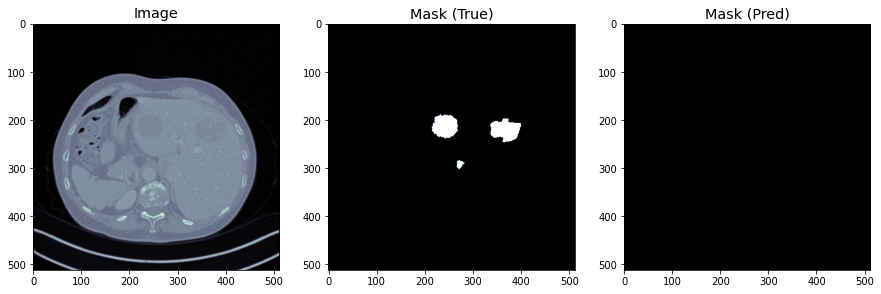

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


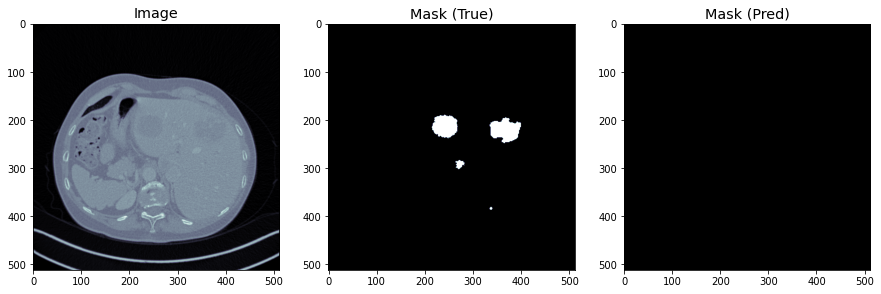

(256, 32, 32, 1)
8/8 [==============================] - 0s 17ms/step
(256, 32, 32, 1)


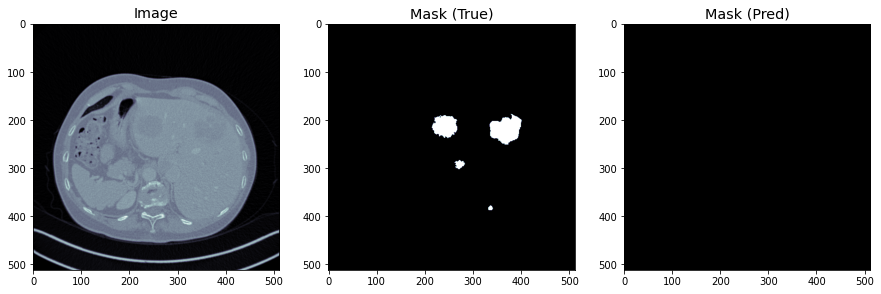

(256, 32, 32, 1)
8/8 [==============================] - 0s 13ms/step
(256, 32, 32, 1)


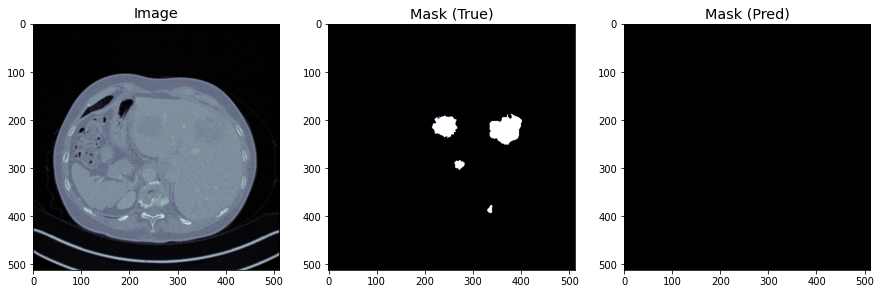

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


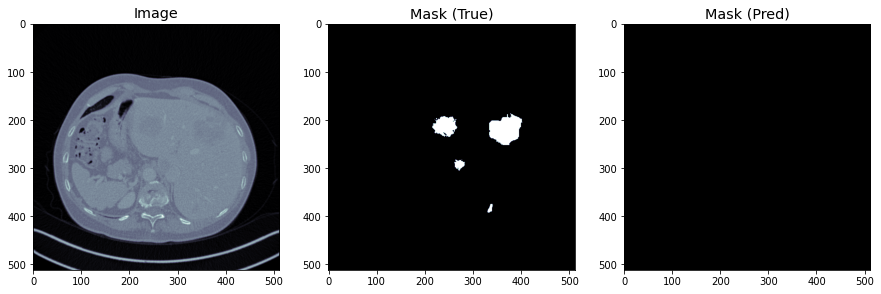

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


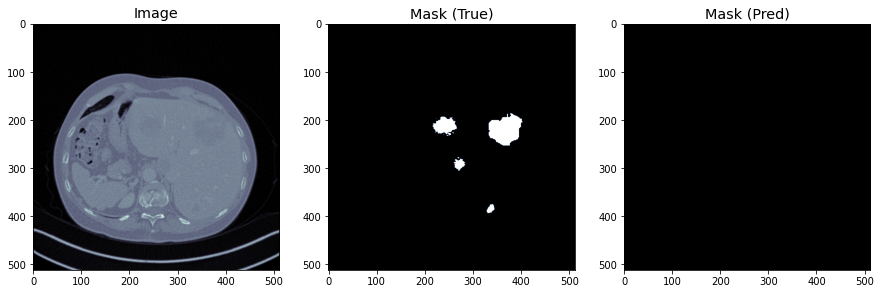

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


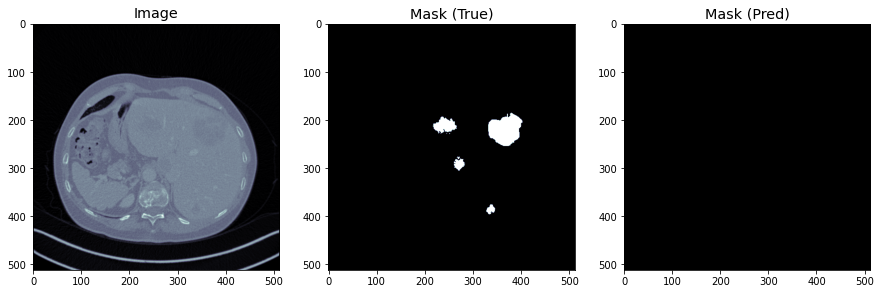

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


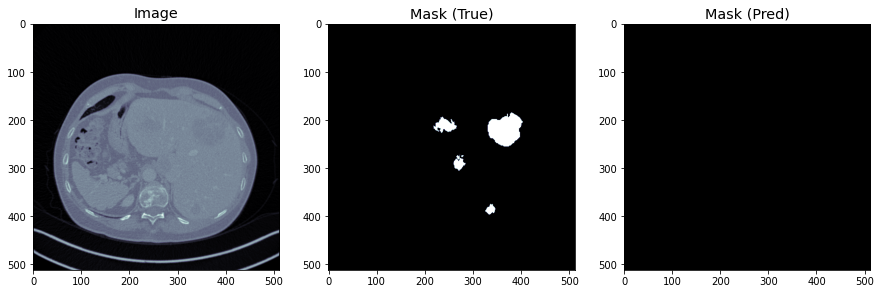

(256, 32, 32, 1)
8/8 [==============================] - 0s 15ms/step
(256, 32, 32, 1)


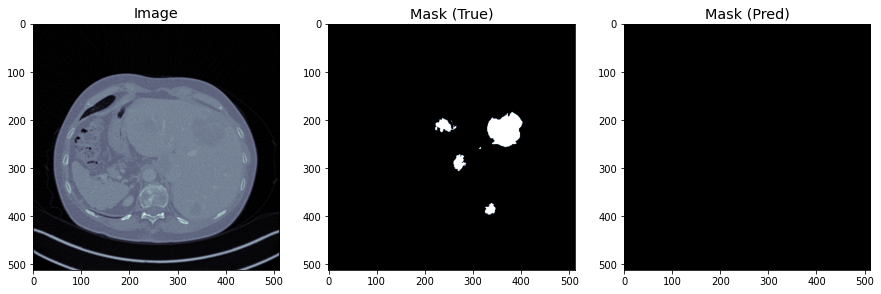

(256, 32, 32, 1)
8/8 [==============================] - 0s 13ms/step
(256, 32, 32, 1)


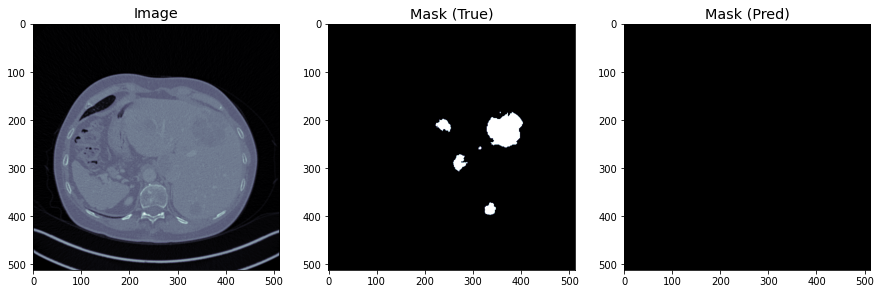

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


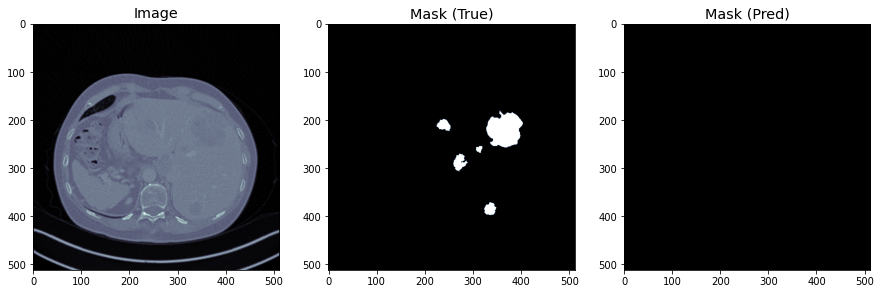

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


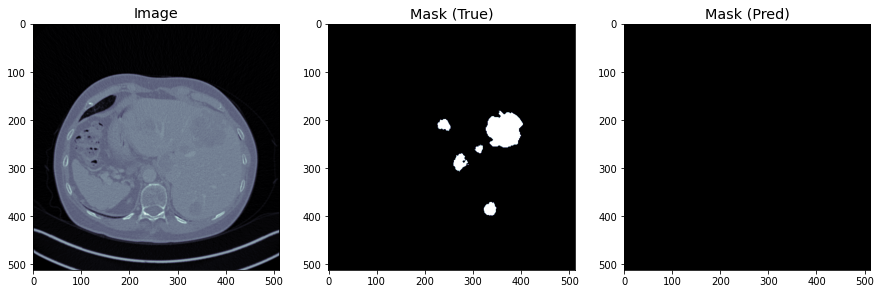

(256, 32, 32, 1)
8/8 [==============================] - 0s 16ms/step
(256, 32, 32, 1)


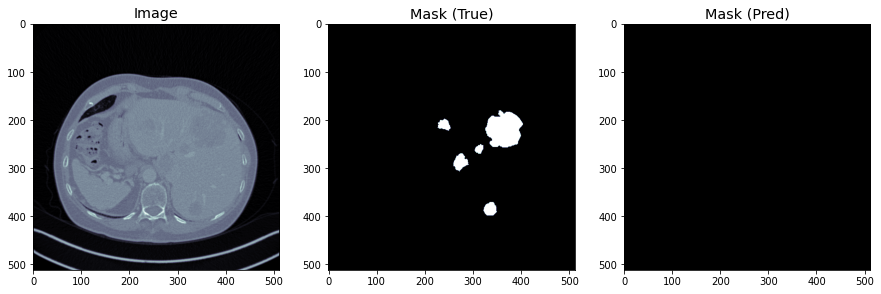

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


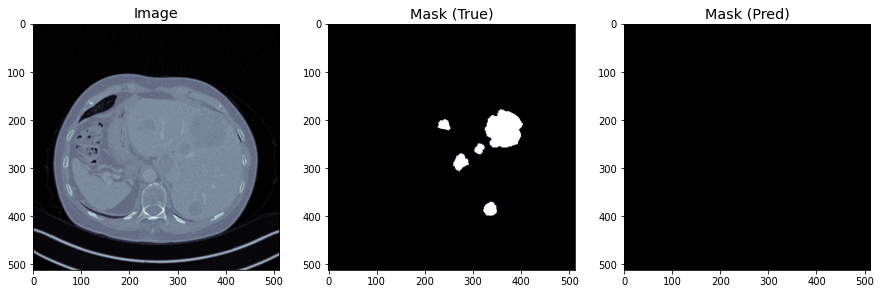

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


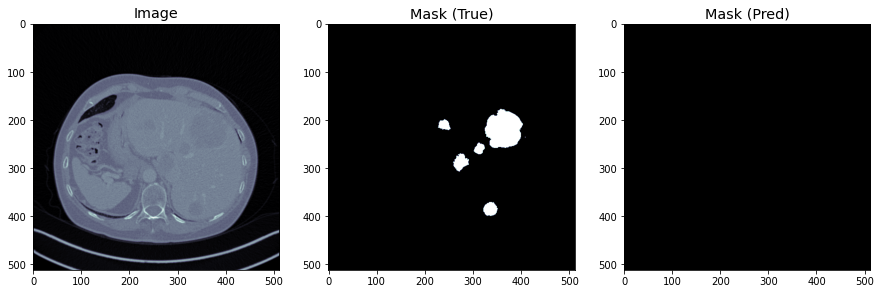

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


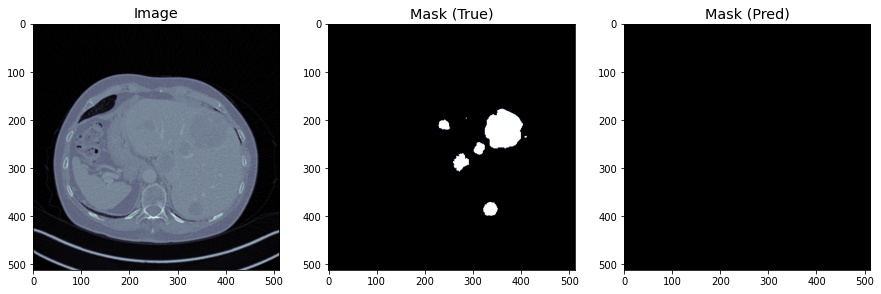

(256, 32, 32, 1)
8/8 [==============================] - 0s 17ms/step
(256, 32, 32, 1)


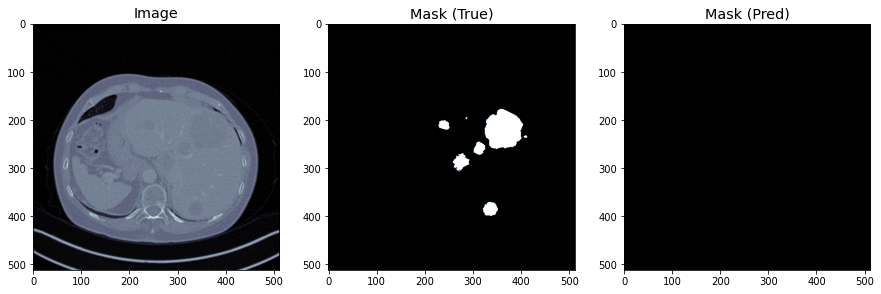

(256, 32, 32, 1)
8/8 [==============================] - 0s 13ms/step
(256, 32, 32, 1)


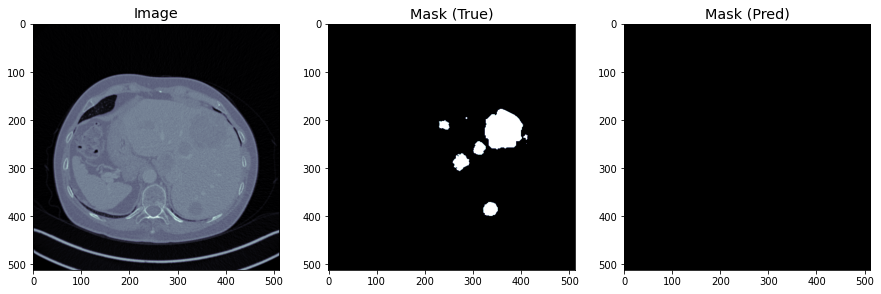

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


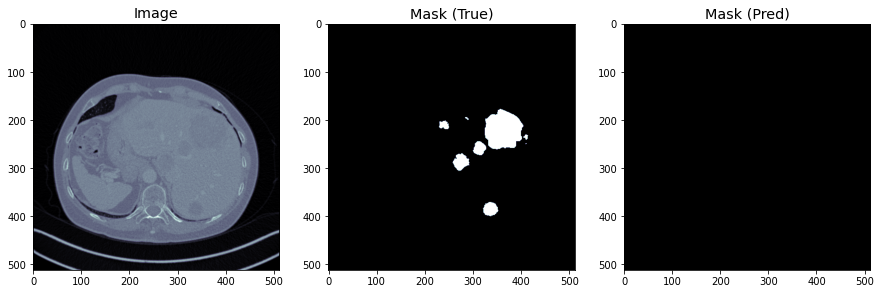

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


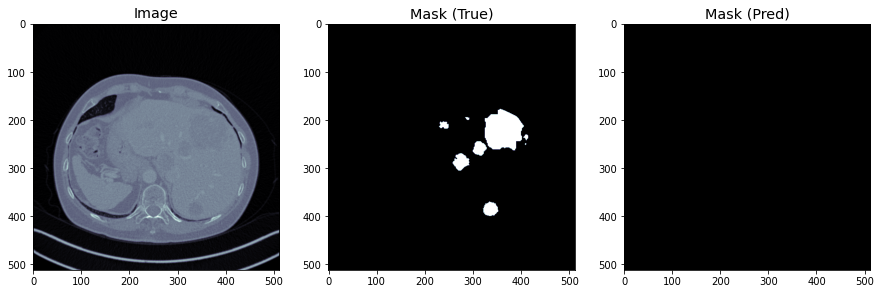

(256, 32, 32, 1)
8/8 [==============================] - 0s 19ms/step
(256, 32, 32, 1)


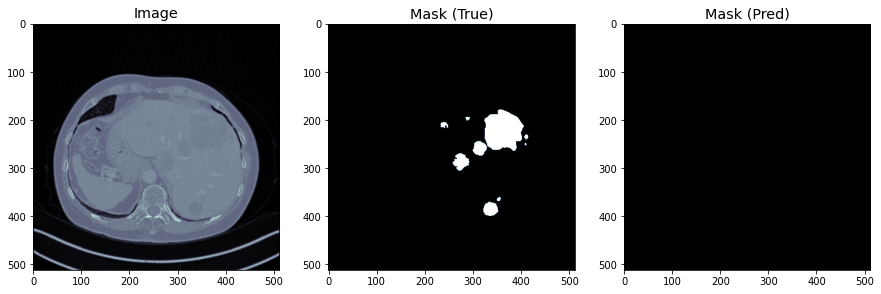

(256, 32, 32, 1)
8/8 [==============================] - 0s 17ms/step
(256, 32, 32, 1)


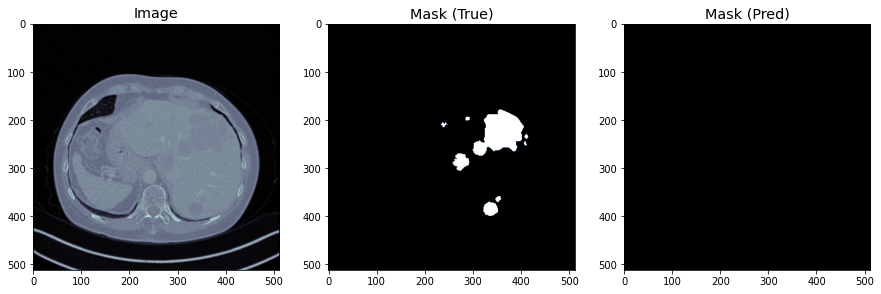

(256, 32, 32, 1)
8/8 [==============================] - 0s 20ms/step
(256, 32, 32, 1)


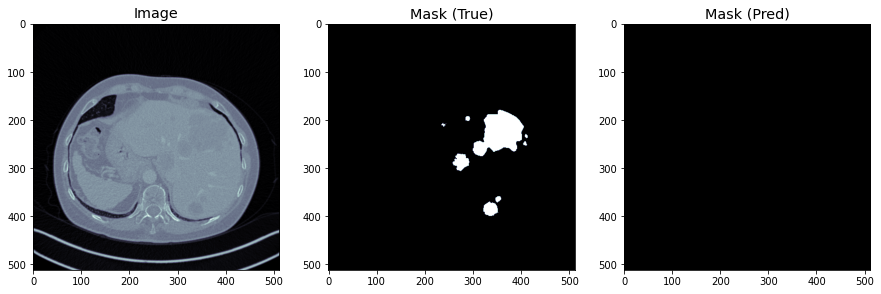

(256, 32, 32, 1)
8/8 [==============================] - 0s 19ms/step
(256, 32, 32, 1)


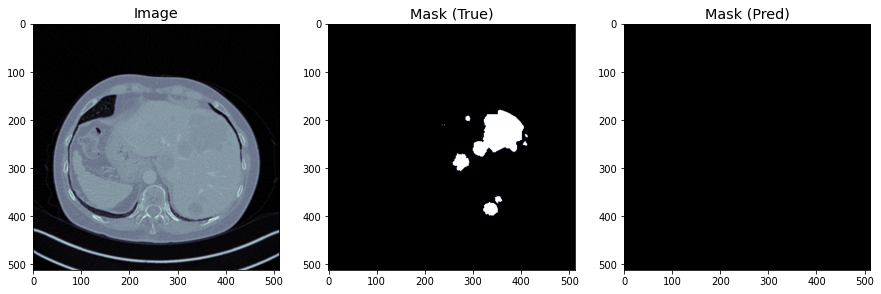

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


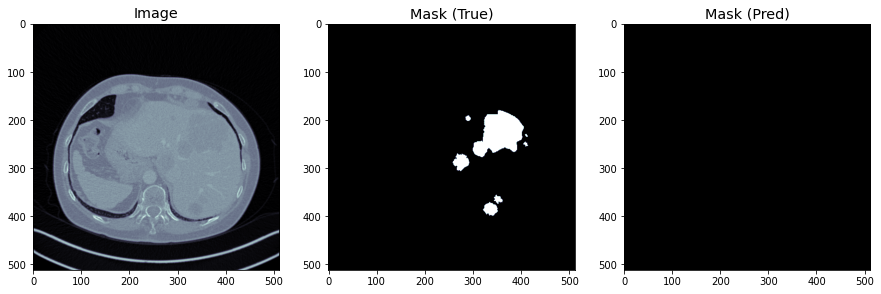

(256, 32, 32, 1)
8/8 [==============================] - 0s 16ms/step
(256, 32, 32, 1)


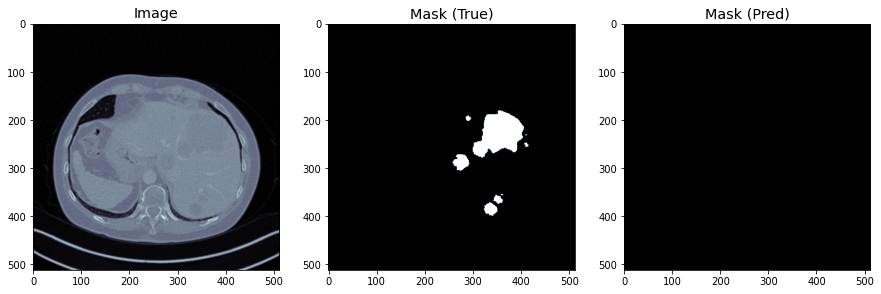

(256, 32, 32, 1)
8/8 [==============================] - 0s 17ms/step
(256, 32, 32, 1)


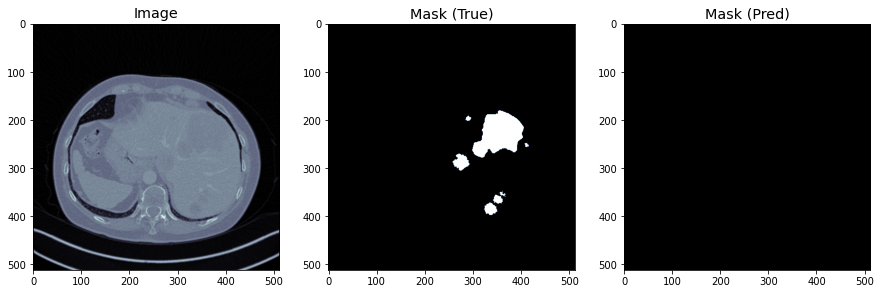

(256, 32, 32, 1)
8/8 [==============================] - 0s 20ms/step
(256, 32, 32, 1)


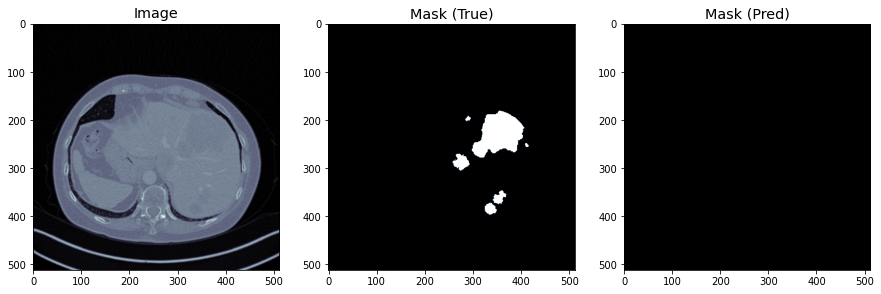

(256, 32, 32, 1)
8/8 [==============================] - 0s 17ms/step
(256, 32, 32, 1)


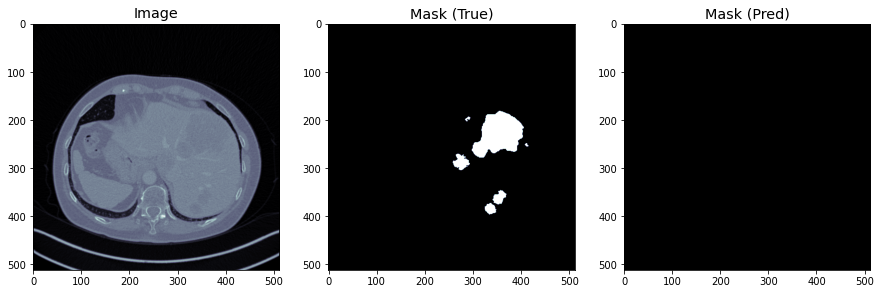

(256, 32, 32, 1)
8/8 [==============================] - 0s 16ms/step
(256, 32, 32, 1)


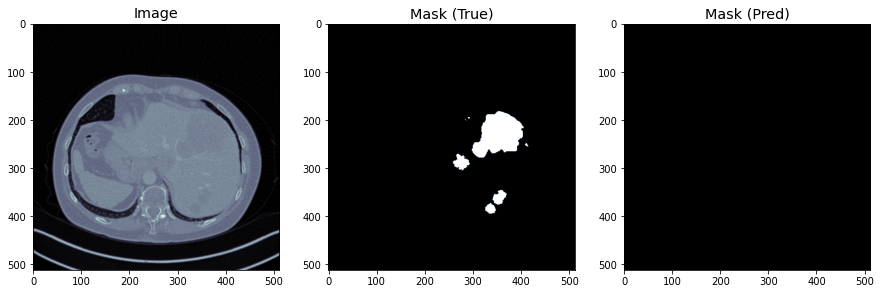

(256, 32, 32, 1)
8/8 [==============================] - 0s 19ms/step
(256, 32, 32, 1)


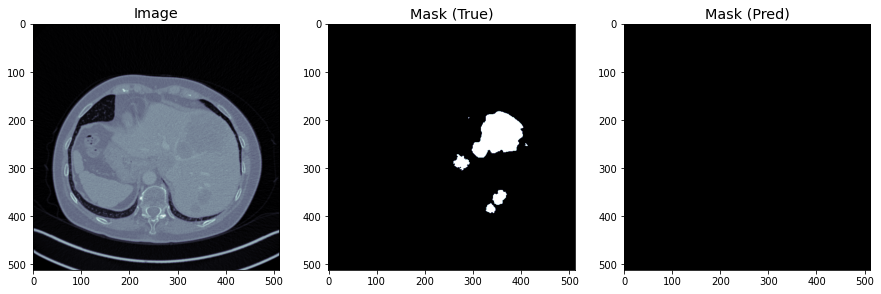

(256, 32, 32, 1)
8/8 [==============================] - 0s 13ms/step
(256, 32, 32, 1)


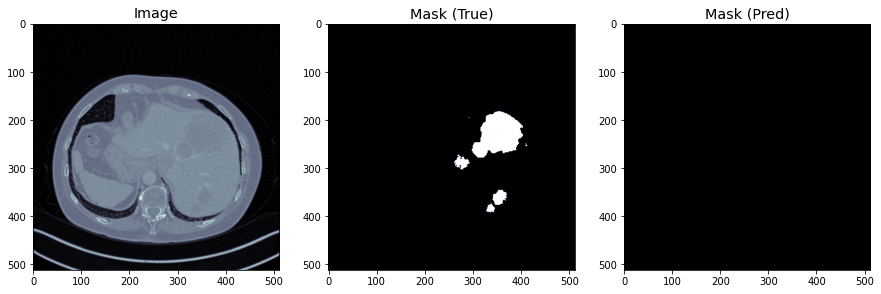

(256, 32, 32, 1)
8/8 [==============================] - 0s 15ms/step
(256, 32, 32, 1)


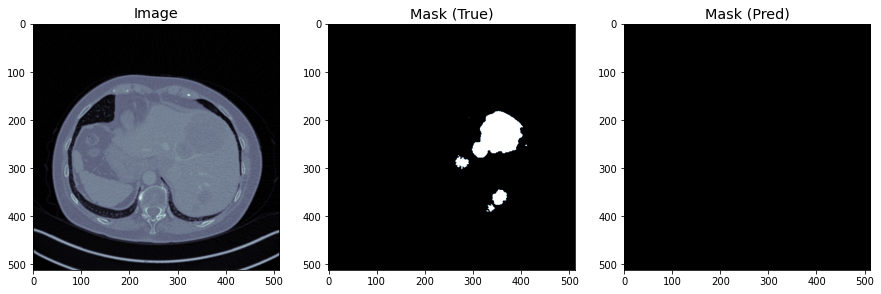

(256, 32, 32, 1)
8/8 [==============================] - 0s 16ms/step
(256, 32, 32, 1)


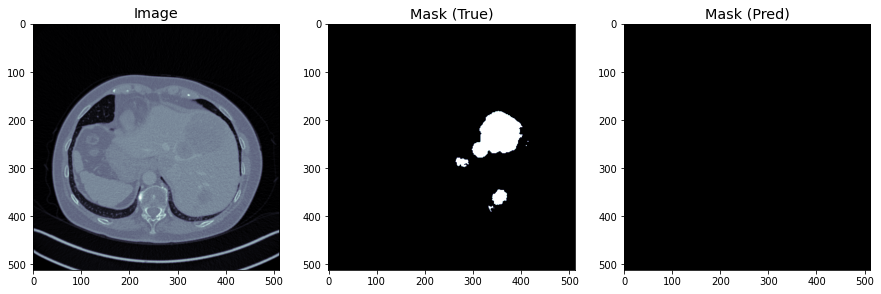

(256, 32, 32, 1)
8/8 [==============================] - 0s 21ms/step
(256, 32, 32, 1)


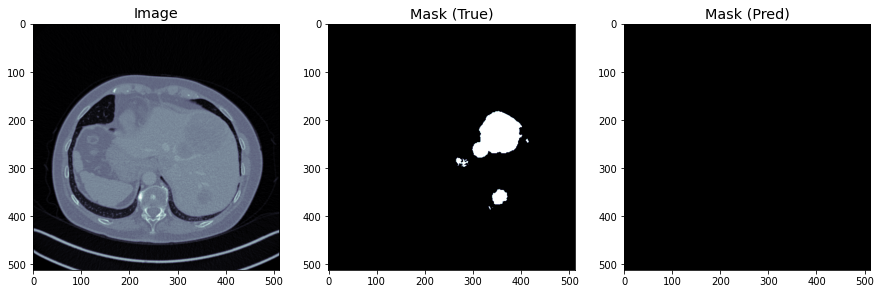

(256, 32, 32, 1)
8/8 [==============================] - 0s 21ms/step
(256, 32, 32, 1)


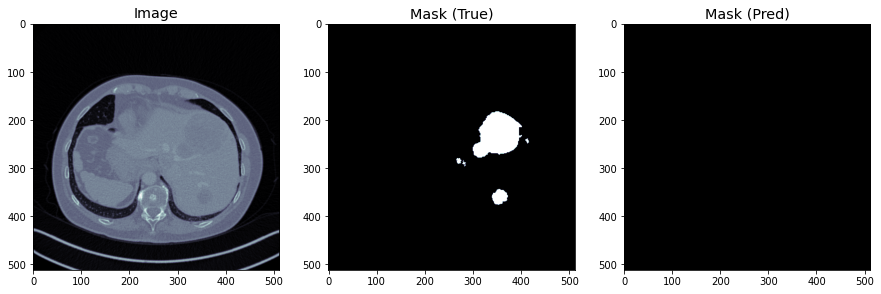

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


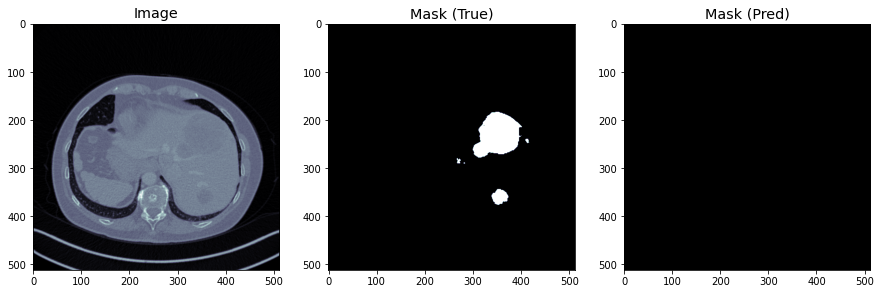

(256, 32, 32, 1)
8/8 [==============================] - 0s 12ms/step
(256, 32, 32, 1)


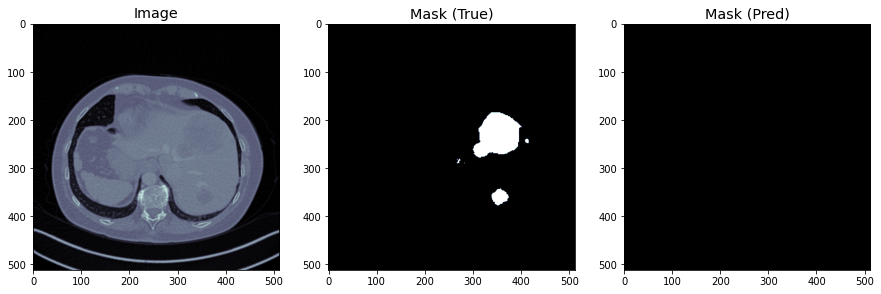

(256, 32, 32, 1)
8/8 [==============================] - 0s 13ms/step
(256, 32, 32, 1)


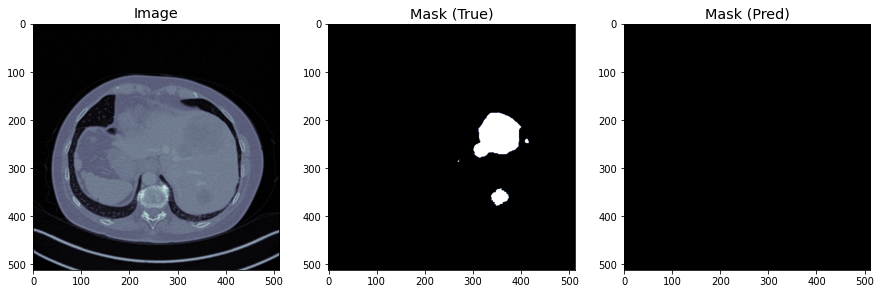

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


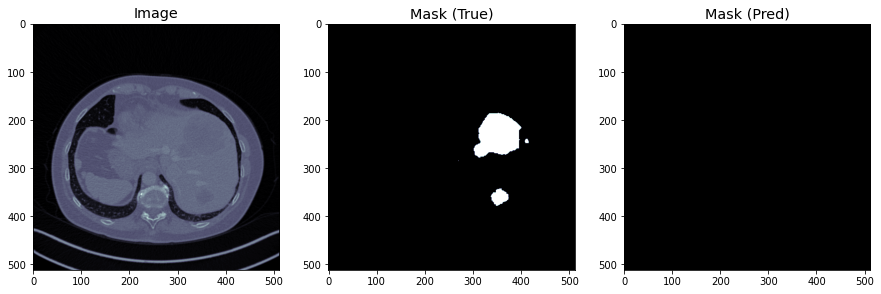

(256, 32, 32, 1)
8/8 [==============================] - 0s 16ms/step
(256, 32, 32, 1)


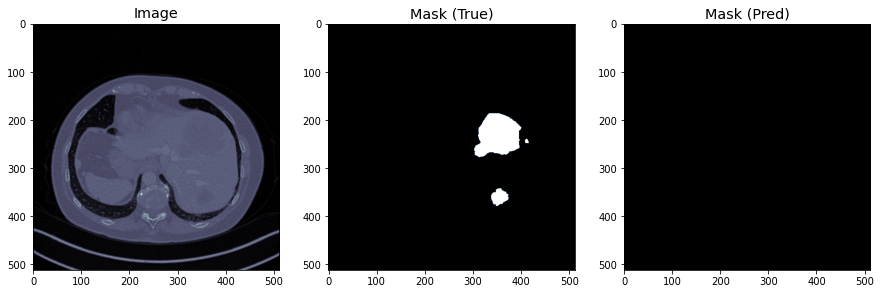

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


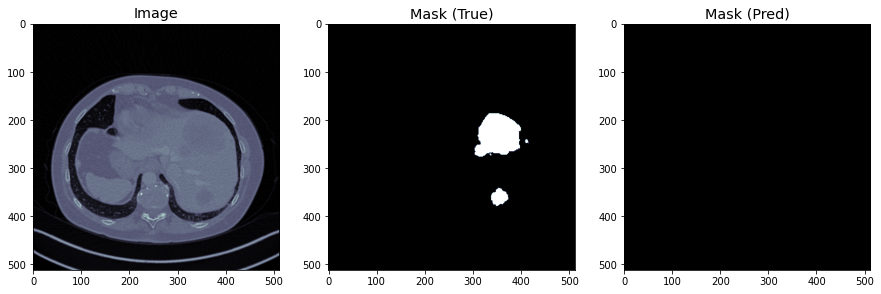

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


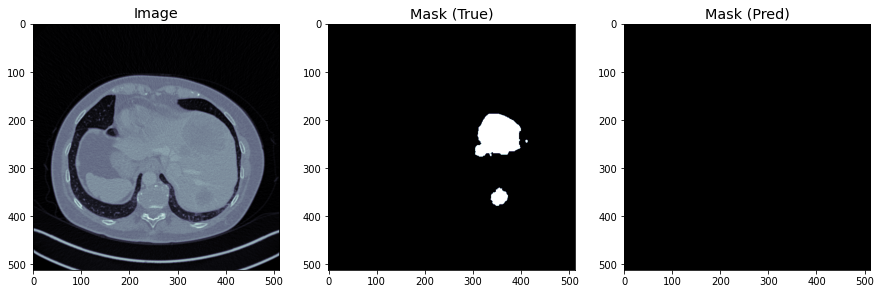

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


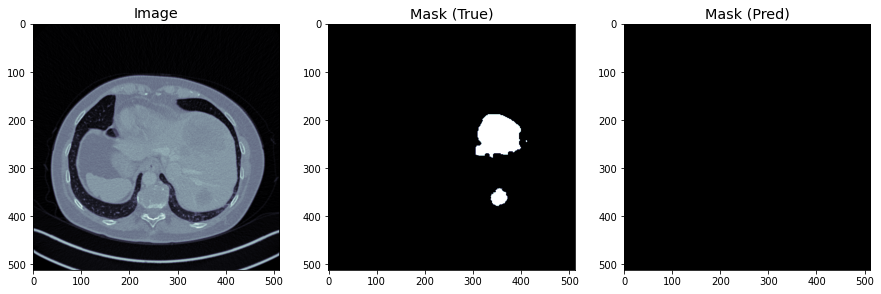

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


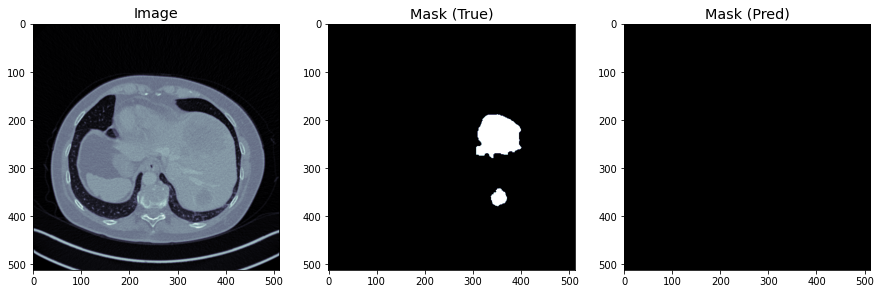

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


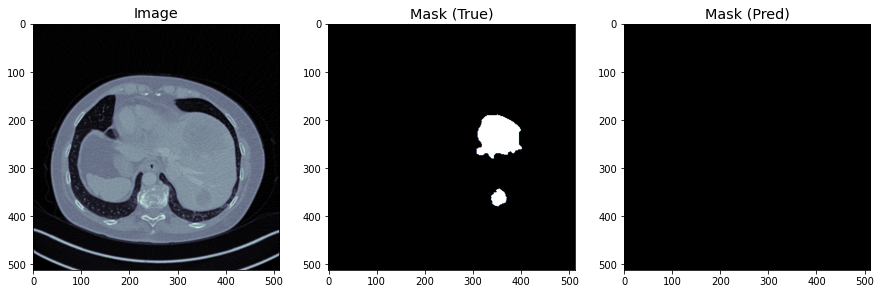

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


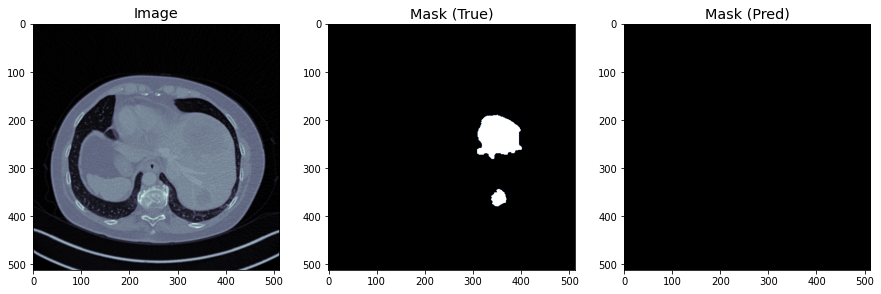

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


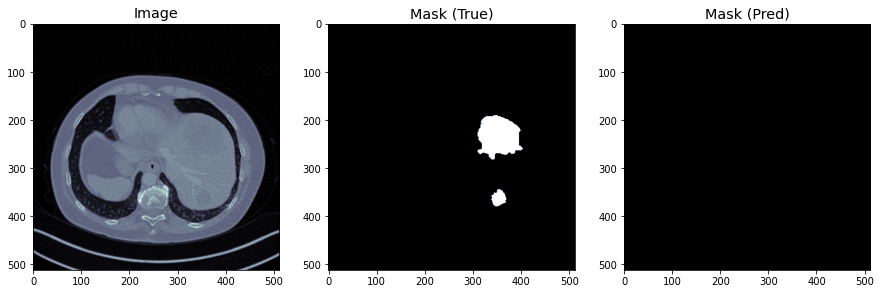

(256, 32, 32, 1)
8/8 [==============================] - 0s 20ms/step
(256, 32, 32, 1)


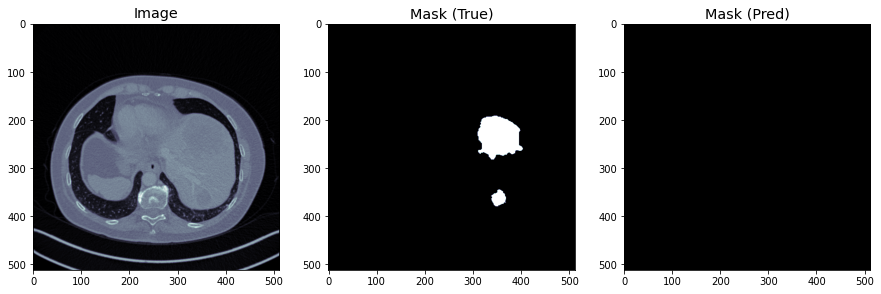

(256, 32, 32, 1)
8/8 [==============================] - 0s 19ms/step
(256, 32, 32, 1)


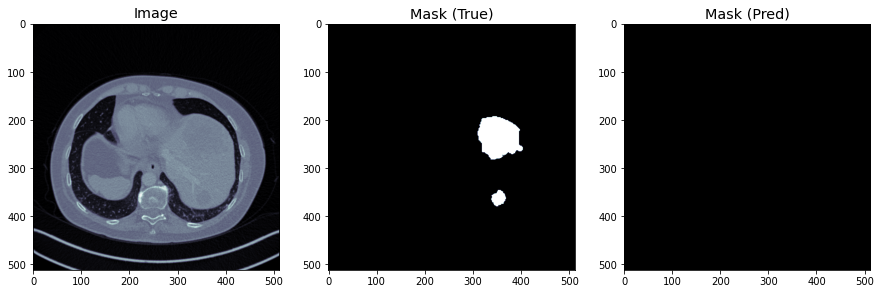

(256, 32, 32, 1)
8/8 [==============================] - 0s 15ms/step
(256, 32, 32, 1)


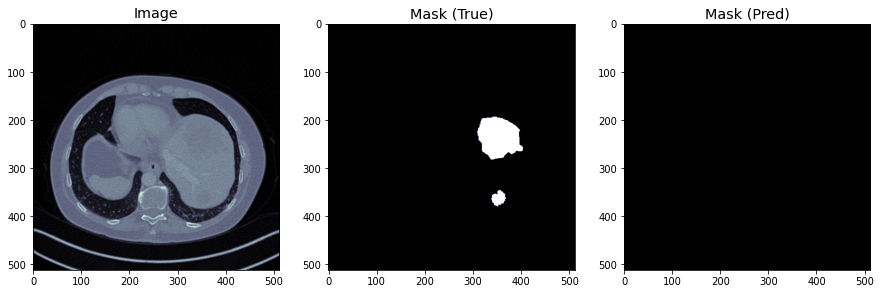

(256, 32, 32, 1)
8/8 [==============================] - 0s 21ms/step
(256, 32, 32, 1)


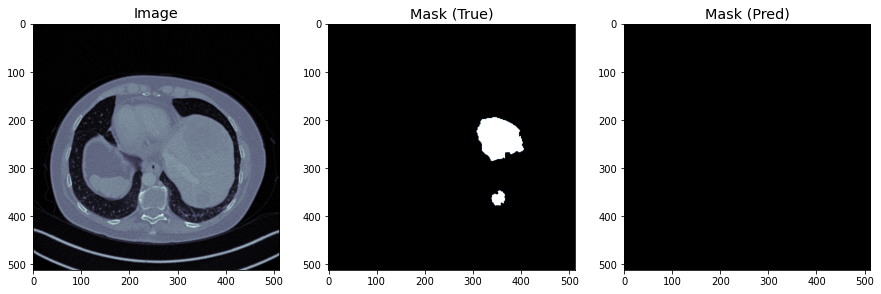

(256, 32, 32, 1)
8/8 [==============================] - 0s 14ms/step
(256, 32, 32, 1)


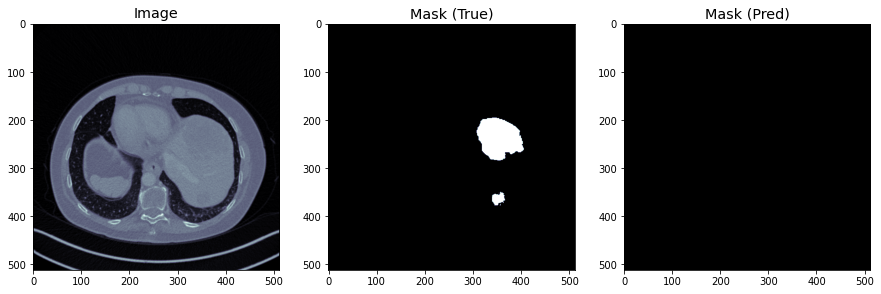

(256, 32, 32, 1)
8/8 [==============================] - 0s 9ms/step
(256, 32, 32, 1)


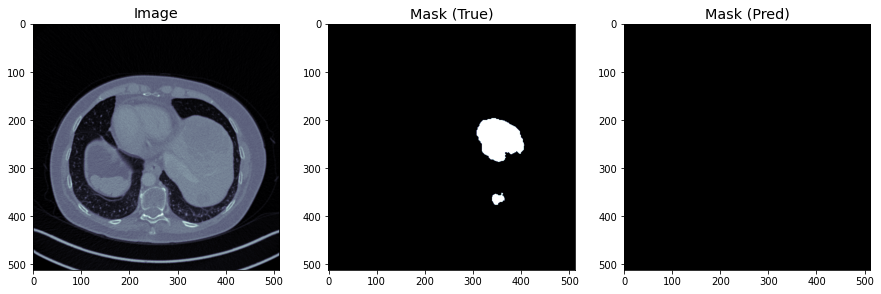

(256, 32, 32, 1)
8/8 [==============================] - 0s 16ms/step
(256, 32, 32, 1)


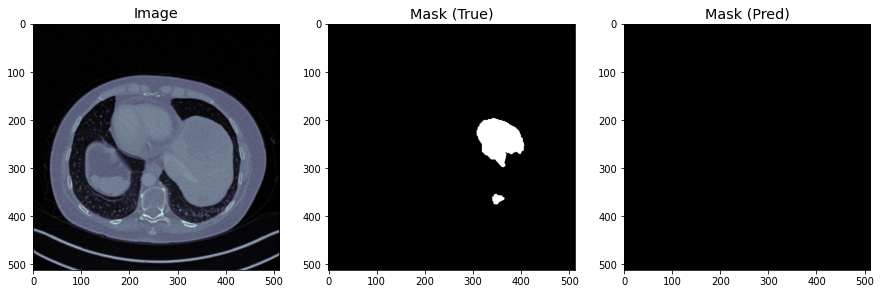

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


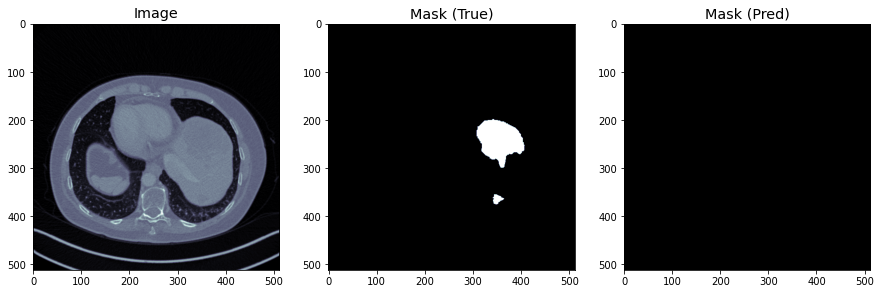

(256, 32, 32, 1)
8/8 [==============================] - 0s 16ms/step
(256, 32, 32, 1)


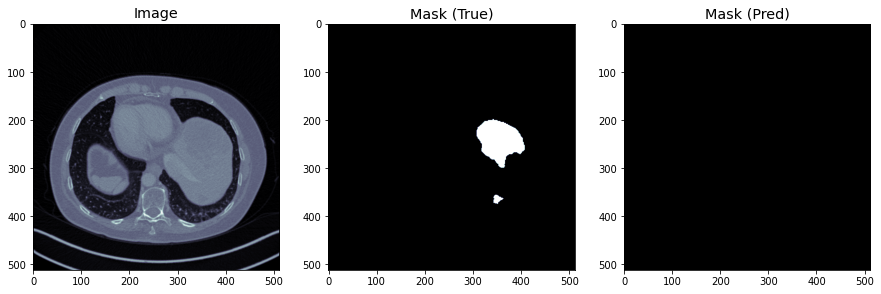

(256, 32, 32, 1)
8/8 [==============================] - 0s 10ms/step
(256, 32, 32, 1)


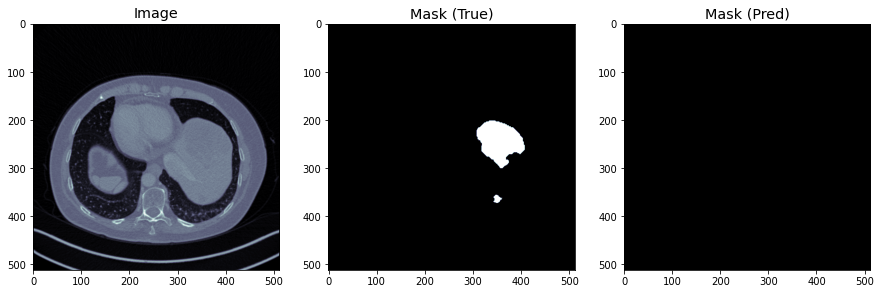

(256, 32, 32, 1)
8/8 [==============================] - 0s 11ms/step
(256, 32, 32, 1)


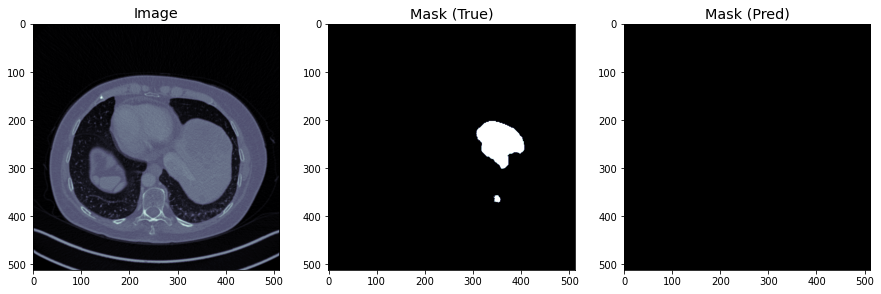

(256, 32, 32, 1)
8/8 [==============================] - 0s 15ms/step
(256, 32, 32, 1)


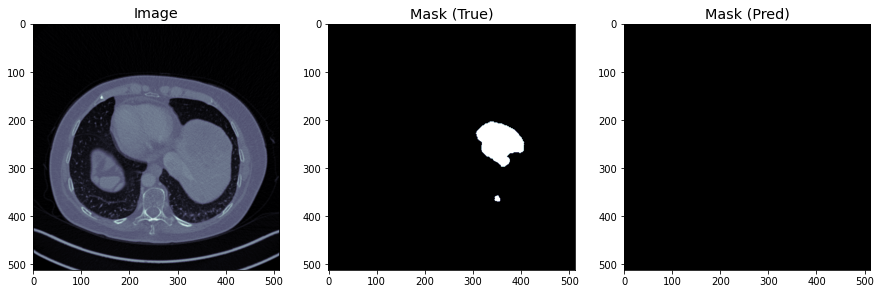

(256, 32, 32, 1)
8/8 [==============================] - 0s 12ms/step
(256, 32, 32, 1)


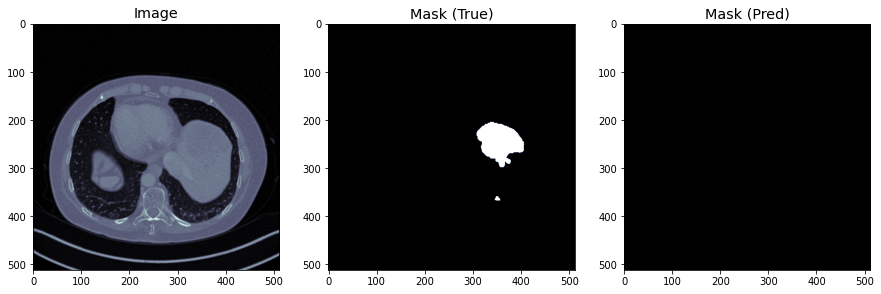

(256, 32, 32, 1)
8/8 [==============================] - 0s 13ms/step
(256, 32, 32, 1)


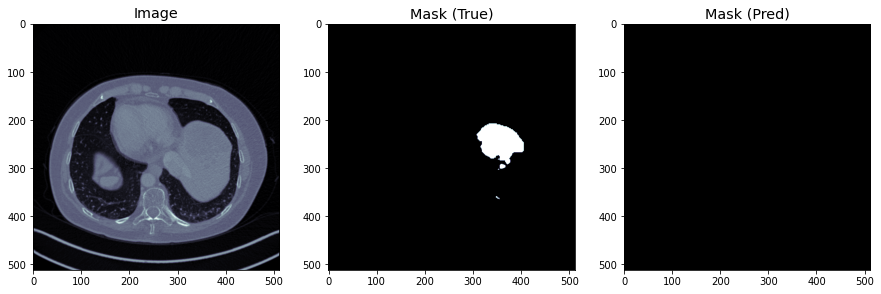

(256, 32, 32, 1)
8/8 [==============================] - 0s 12ms/step
(256, 32, 32, 1)


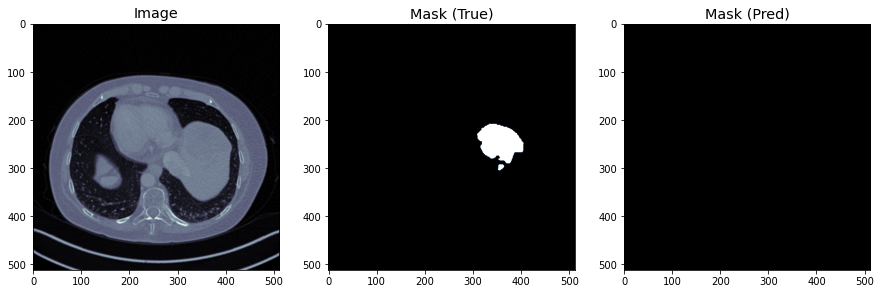

(256, 32, 32, 1)
8/8 [==============================] - 0s 12ms/step
(256, 32, 32, 1)


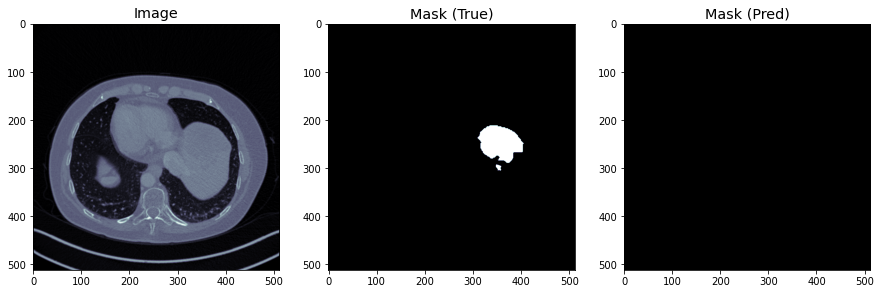

(256, 32, 32, 1)
1/8 [==>...........................] - ETA: 0s

KeyboardInterrupt: 

In [70]:
mask_ex[mask_ex == 1] = 0

for i in range(mask_ex.shape[2]):
    _, count = np.unique(mask_ex[:, :, i], return_counts=True)
    
    if len(count) > 1 and count[1] > 300:
        
        patch_ex = slice_patch(img_ex[:, :, i])
        prediction = loaded_model.predict(patch_ex)
        print(prediction.shape)
        prediction_mask = patch_to_slice(prediction, patch_ratio, input_shape, conf_threshold = 0.97)
        
        fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize = ((15, 15)))
        
        ax1.imshow(np.rot90(img_ex[:, :, i], 3), cmap = 'bone')
        ax1.set_title("Image", fontsize = "x-large")
        ax1.grid(False)
        ax2.imshow(np.rot90(mask_ex[:, :, i], 3), cmap = 'bone')
        ax2.set_title("Mask (True)", fontsize = "x-large")
        ax2.grid(False)
        ax3.imshow(np.rot90(prediction_mask.reshape((512, 512)), 3), cmap = 'bone')
        ax3.set_title("Mask (Pred)", fontsize = "x-large")
        ax3.grid(False)
        plt.show()

In [ ]:
img=nib.load(mask_path[1])
print(type(img))
img_data=img.get_fdata()

<class 'nibabel.nifti1.Nifti1Image'>


In [ ]:
img_data=np.array(img_data)

In [ ]:
type(np.array(img_data))

numpy.ndarray

In [ ]:
img_data.shape

(512, 512, 139)

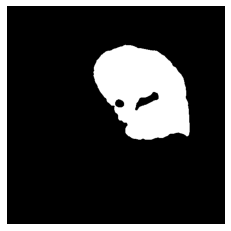

In [ ]:
plt.imshow(img_data[:,:,100],cmap='gray')
plt.axis('off')
plt.show()

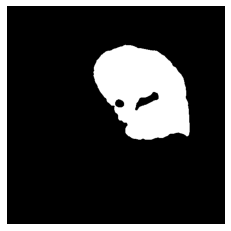

In [ ]:
t=img_data.copy()
t[t == 2] = 1
plt.imshow(t[:,:,100],cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
a=img_data[:,:,0]
a.shape

(512, 512)

In [ ]:
exp=np.expand_dims(a,axis=2)
exp.shape

(512, 512, 1)

C:\Users\ghrceaiml1\AppData\Local\Temp\176\ipykernel_32200\339916889.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img=np.array(nib.load(img_path[i]).get_data())


In [ ]:
mask_list=[]
label=1
for i in range(0,5):
    img=np.array(nib.load(mask_path[i]).get_data())
    img.astype('float32')
    if label==1:
        img[img == 1] = 0
    if label==0:
        img[img == 2] = 1
    for slice in range(0,img.shape[2]):
        img_s=img[:,:,slice]
        img_s=np.expand_dims(img_s,axis=2)
        mask_list.append(img_s)
mask_arr=np.array(img_list)
    

C:\Users\ghrceaiml1\AppData\Local\Temp\176\ipykernel_32200\1389067223.py:4: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img=np.array(nib.load(mask_path[i]).get_data())


(640, 512, 512, 1)